# Random Network Generation
## Mohammad Ghoraishi - 99100788 

---
We want to generate a network with number of nodes N and average degree $\lambda$. I'm using Julia for this purpose and the network creation function is written in t he RandomNetwork.jl file. I have not used any libraries for the purpose of generating the network and the network is stored in an adjacency list which is just an array where each node has a corresponding index and in each index of the array, another array is stored that shows which nodes is said node connected to. <br>
Example: (_Example Source: Karnak Julia Docs_) <br>
[[2, 5, 7],<br>
[1, 3, 9],<br>
[2, 4, 11],<br>
[3, 5, 13],<br>
[1, 4, 15],<br>
[7, 15, 20],<br>
[1, 6, 8],<br>
[7, 9, 16],<br>
[2, 8, 10],<br>
[9, 11, 17],<br>
[3, 10, 12],<br>
[11, 13, 18],<br>
[4, 12, 14],<br>
[13, 15, 19],<br>
[5, 6, 14],<br>
[8, 17, 20],<br>
[10, 16, 18],<br>
[12, 17, 19],<br>
[14, 18, 20],<br>
[6, 16, 19]] <br>
which generates the graph below: <br>
![Alt text](<graph example.svg>) <br>

---
The function used to generate the graphs is called **GenerateNetwork** located in the _RandomNetwork.jl_ file. An explanation of said function is brought below: <br>
    GenerateNetwork(lambda::Float64, N::Integer, UseTrueRandom::Bool)

Generates a random network with average degree lambda and nodes N.

### Arguments
* `lambda` = the average degree of all nodes.
* `N` = Number of nodes in the network.
* `AlgorithmType` = if type 1 is selected, vertices will be generated with a probability and multiple vertices between the same nodes wouldn't exist. <br>
                    if type 2 is selected, then an exact number of vertices will be generated and then they would be randomly distributed.



In [8]:
include("RandomNetwork.jl")
using .RandomNetwork
using Karnak, Graphs, Plots, Colors #I'm using karnak and Graphs to draw the graphs which are stored in adjacency lists.


## Using Algorithm Type one:

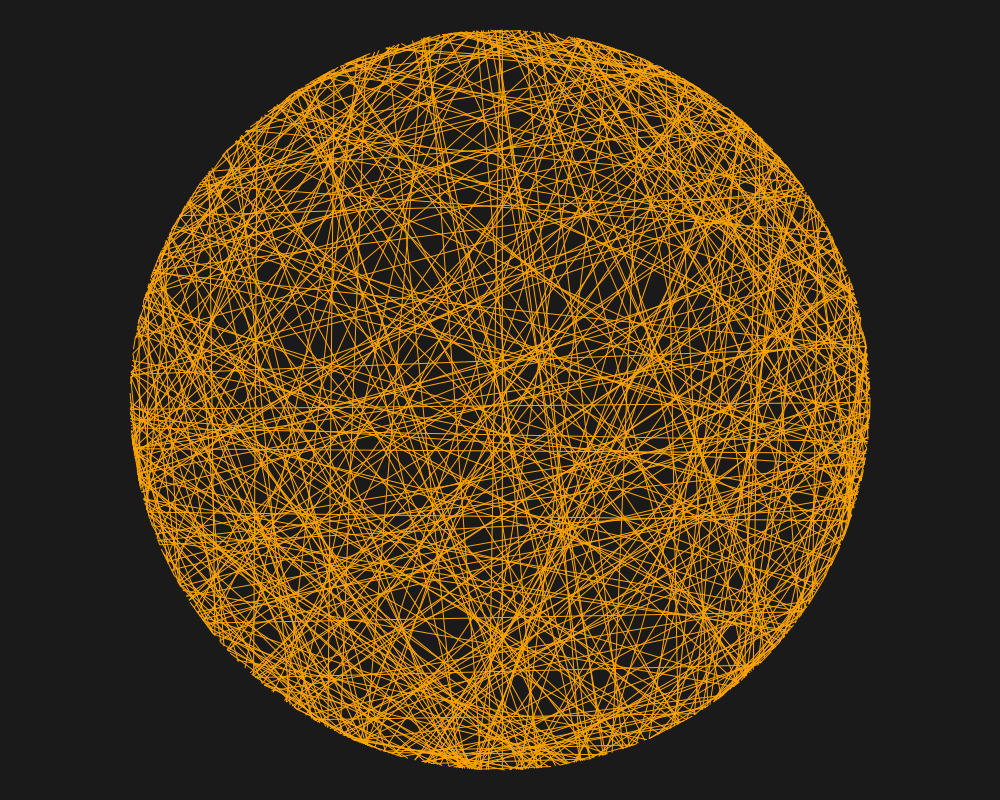

In [28]:
#Initial parameters
N = 1000
lambda = 1
Net = RandomNetwork.GenerateNetwork(lambda, N, 1)
g = Graph(N, Net)

@drawsvg begin
    background("grey10")
    sethue("orange")
    drawgraph(g, layout=shell, vertexshapesizes = 0.1, vertexstrokeweights = 0.001, vertexstrokecolors = colorant"red")
    end 1000 800

After $N = 1000$ The plot will almost become a filled in circle so I won't draw that.(I drew the graph using the shell layout because the calculations for the stress layout would take too long). <br>
Just to see that the generator works, here is the adjacency list and a test for $\lambda$:

In [29]:
Net

1000-element Vector{Vector{Int64}}:
 []
 [577, 994]
 [317]
 []
 []
 [79, 220, 605, 794]
 [248]
 []
 [941]
 [241, 343]
 ⋮
 []
 []
 [2, 219, 423, 560, 849, 892, 920]
 []
 [585]
 [682]
 [127]
 []
 [505]

In [30]:
global sum = 0
for i in 1:N
    global sum += length(Net[i])
end
ActualLambda = sum / N
println("Actual value for lambda = $ActualLambda")

Actual value for lambda = 0.978


### Degree Distribution
First we generate a network then put their degrees into an array, then we plot the histogram of said array. (The minimum and maximum degrees are available in the plots)

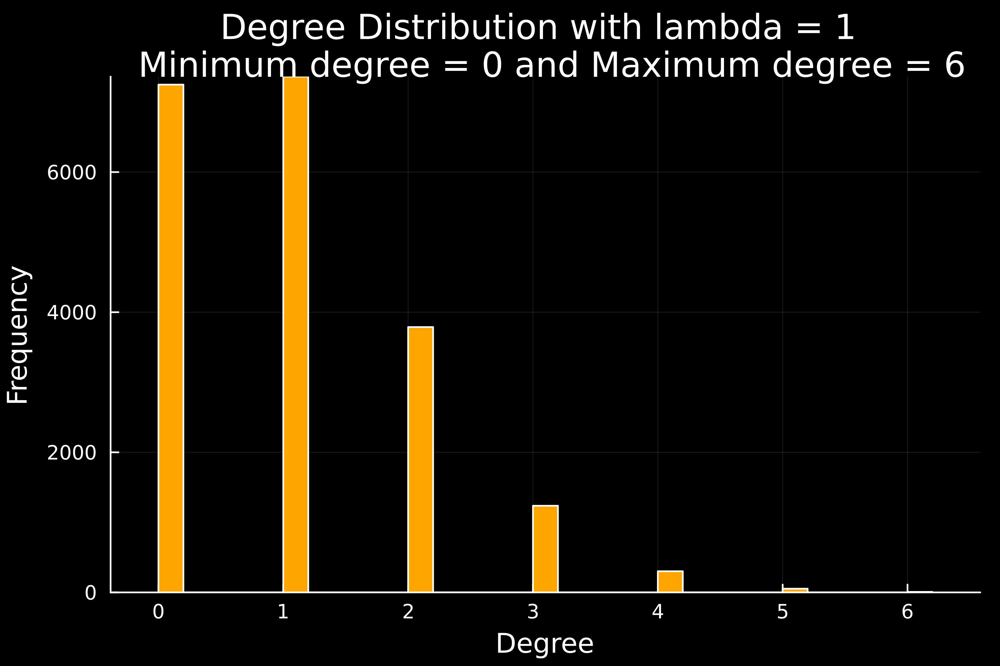

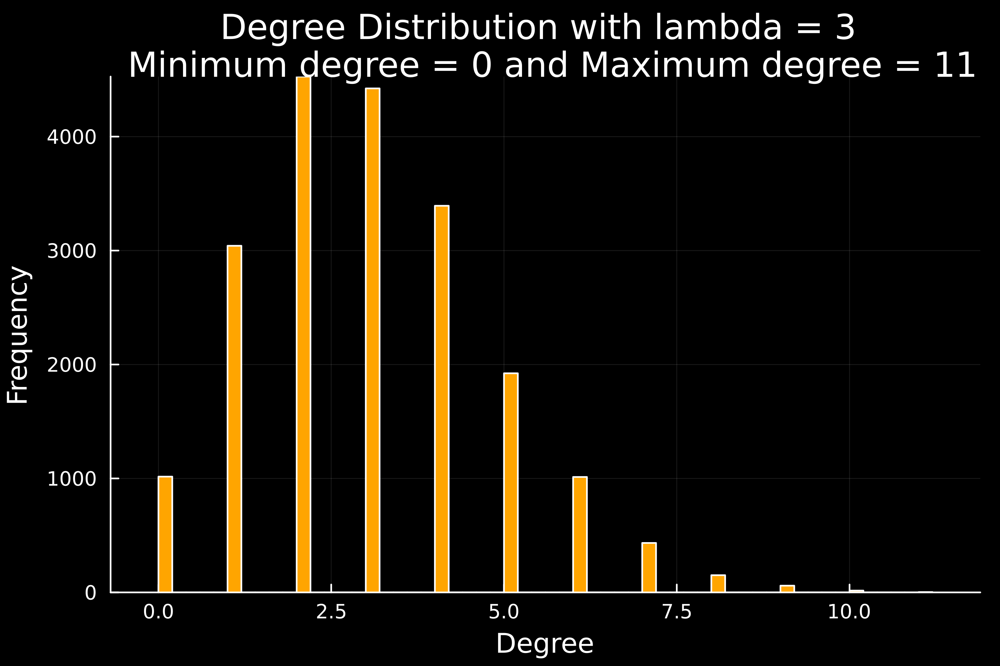

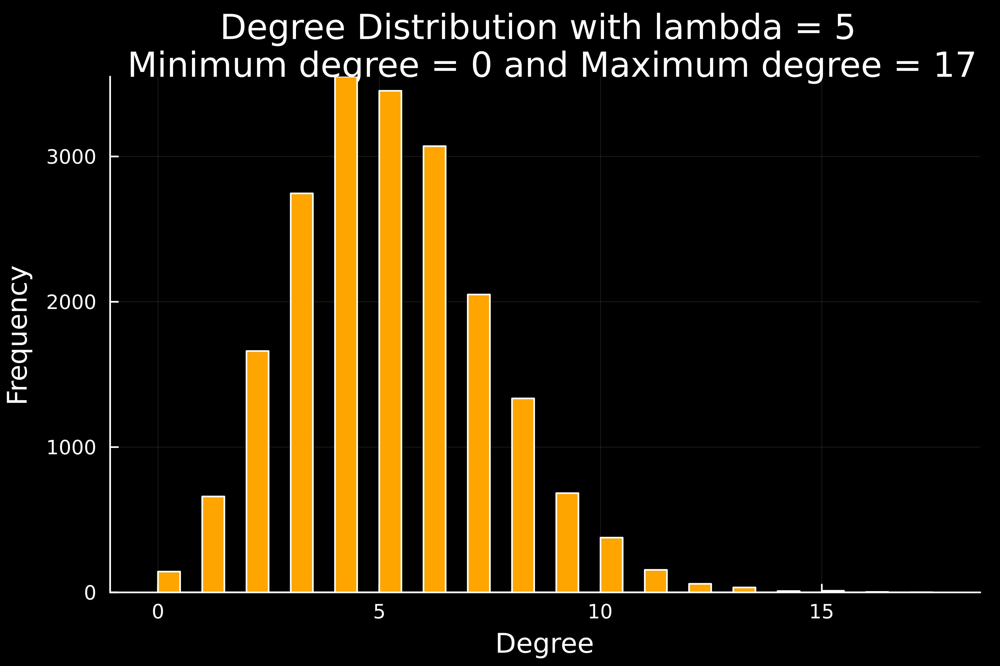

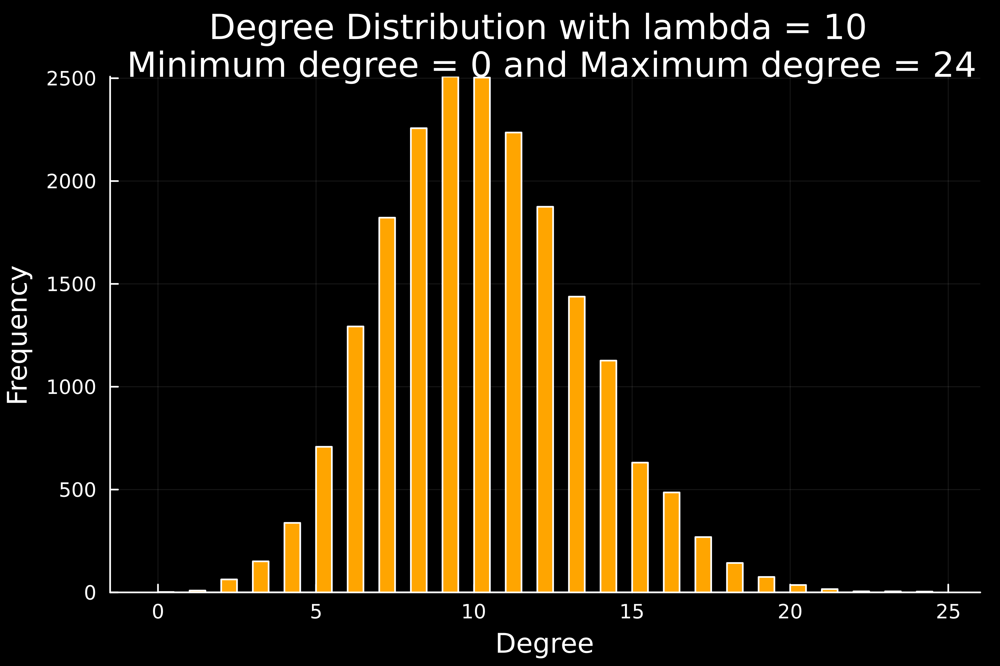

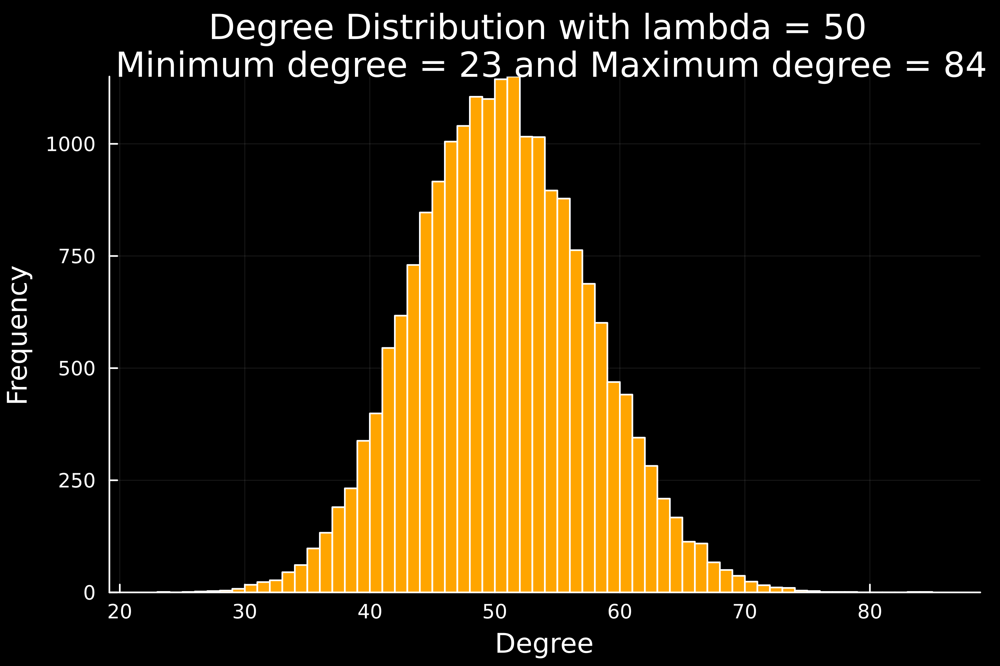

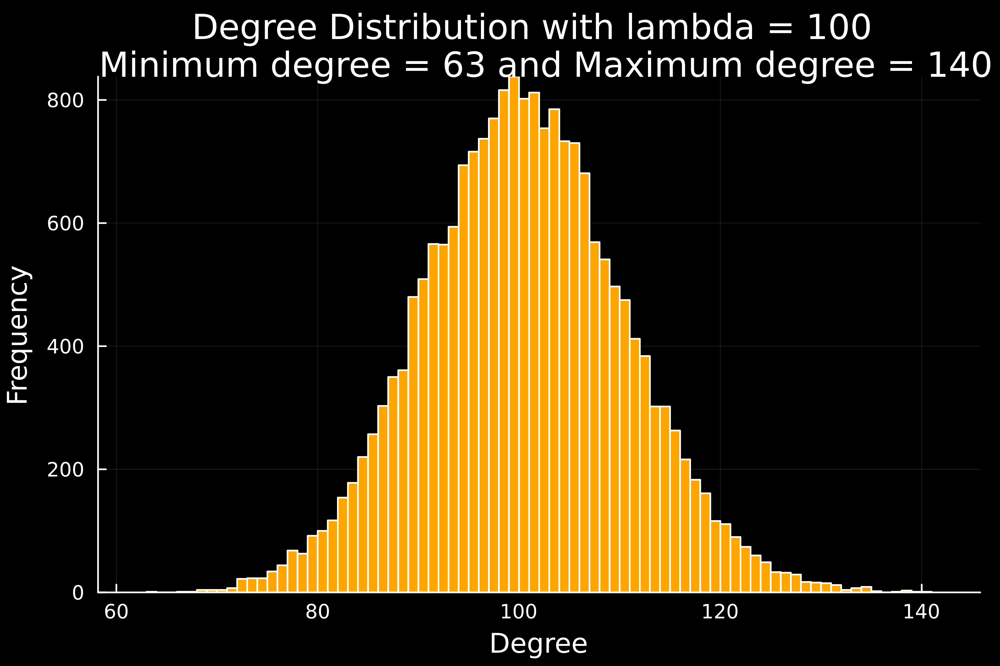

In [44]:
#Network Generation
N = 20000
lambdaArr = [1, 3, 5, 10, 50, 100] #Array of all lambdas we want to test
for lambda in lambdaArr
    DegreesArr = Int64[]
    Net = RandomNetwork.GenerateNetwork(lambda, N, 1)
    for j in 1:N
        push!(DegreesArr, length(Net[j]))
    end
    MinimumDegree = minimum(DegreesArr)
    maximumDegree = maximum(DegreesArr)
    display(histogram(DegreesArr, dpi = 500, title = "Degree Distribution with lambda = $lambda \n Minimum degree = $MinimumDegree and Maximum degree = $maximumDegree"
    , background = :black, legend = false,
     xlabel = "Degree", ylabel = "Frequency", color = :orange))
end


The Distribution seems to look like a normal distribution in higher $\lambda$ s around the specified $\lambda$.

---
### Neighbour Degree Distribution
Here we select a number of nodes, then we find their neighbours and store the degrees of these neighbour nodes in a new array. We exclude the nodes that don't have any neighbours. (The minimum and maximum degrees specified in the plots show the minimum and maximum degrees of neighbours of nodes)

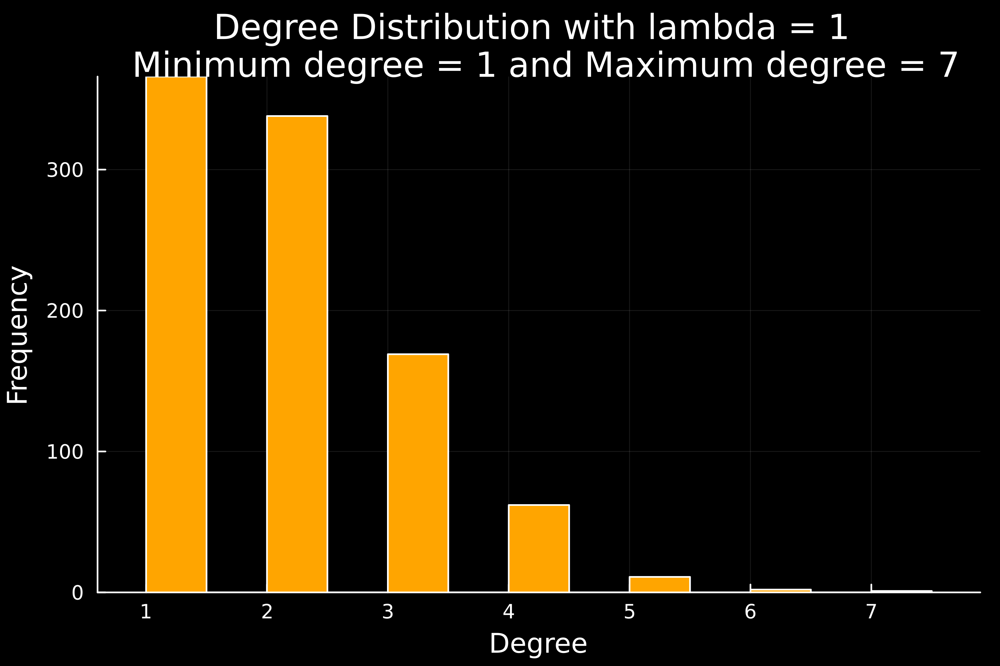

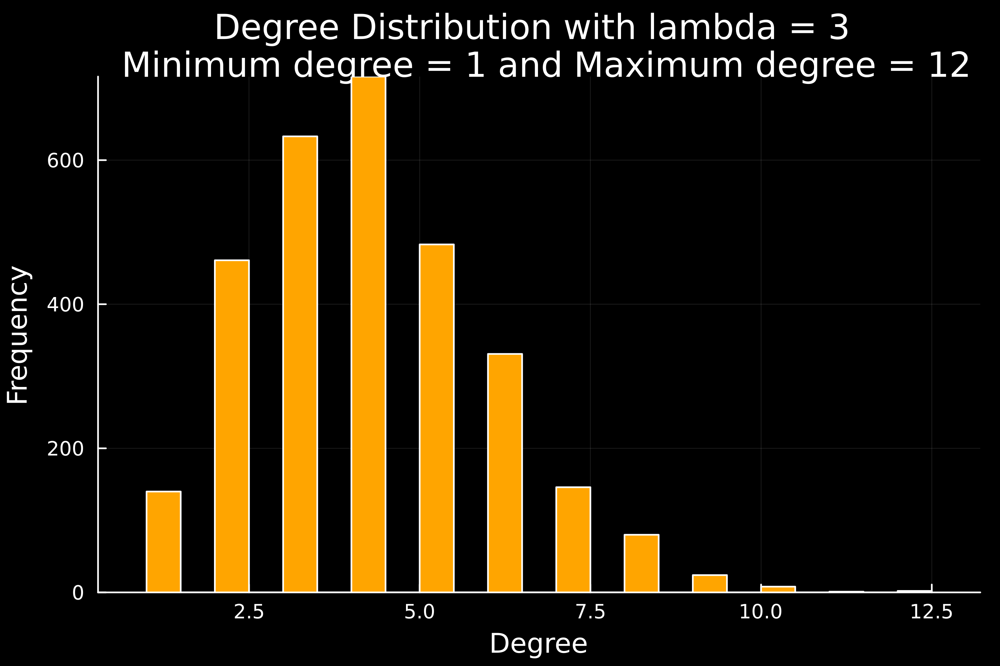

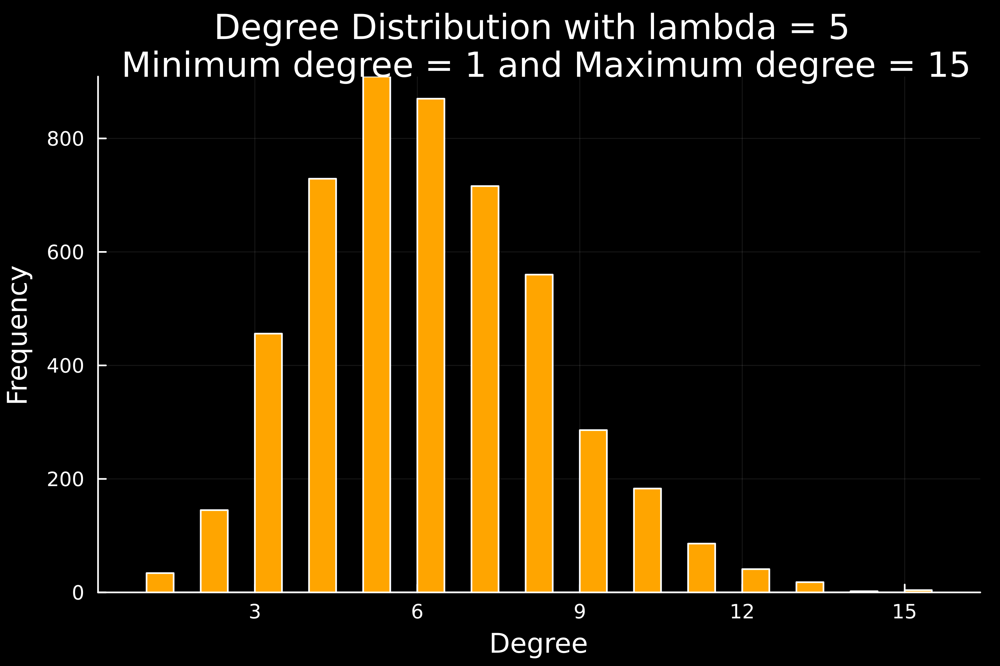

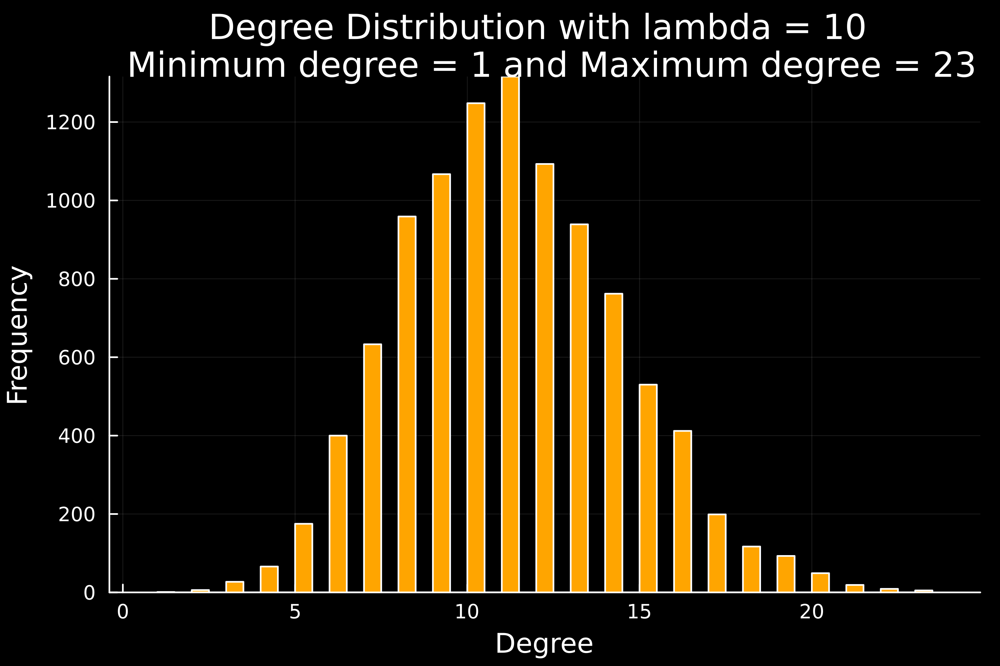

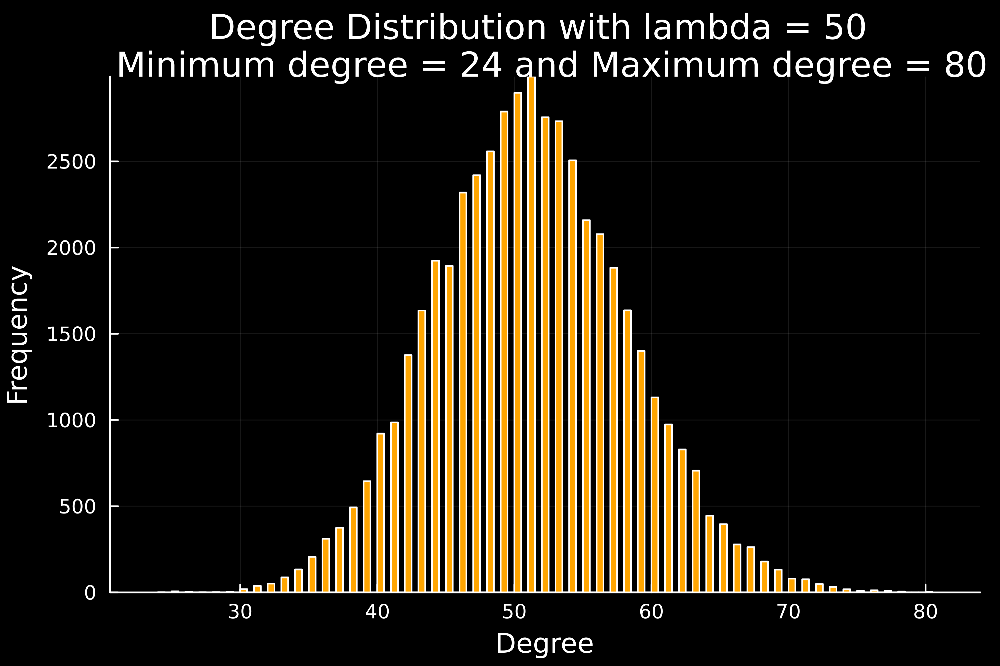

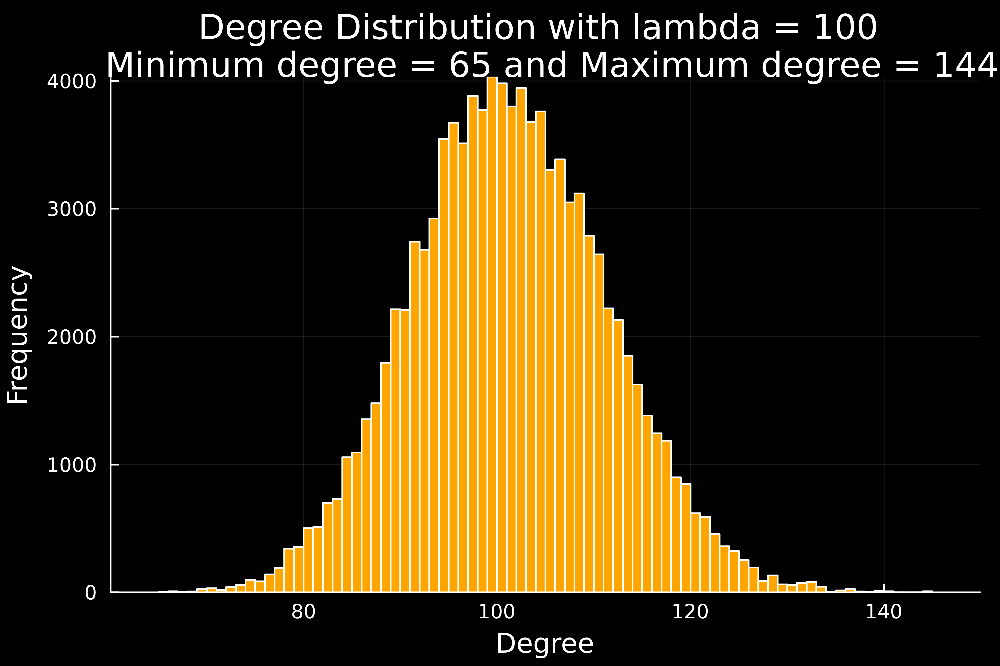

In [49]:
N = 20000
lambdaArr = [1, 3, 5, 10, 50, 100] #Array of all lambdas we want to test
SampleCount = 1000 #Number of randomly chosen nodes
for lambda in lambdaArr
    DegreesArr = Int64[]
    Net = RandomNetwork.GenerateNetwork(lambda, N, 1)
    for j in 1:SampleCount
        SelectedNode = rand(1:N)
        NeighbourArr = Net[SelectedNode]
        NeighbourCount = length(NeighbourArr)
        if NeighbourCount != 0
            for j in NeighbourArr
                push!(DegreesArr, length(Net[j]))
            end
        end
    end
    MinimumDegree = minimum(DegreesArr)
    maximumDegree = maximum(DegreesArr)
    display(histogram(DegreesArr, dpi = 500, title = "Degree Distribution with lambda = $lambda \n Minimum degree = $MinimumDegree and Maximum degree = $maximumDegree"
    , background = :black, legend = false,
     xlabel = "Degree", ylabel = "Frequency", color = :orange))
end


## Using Algorithm Type Two

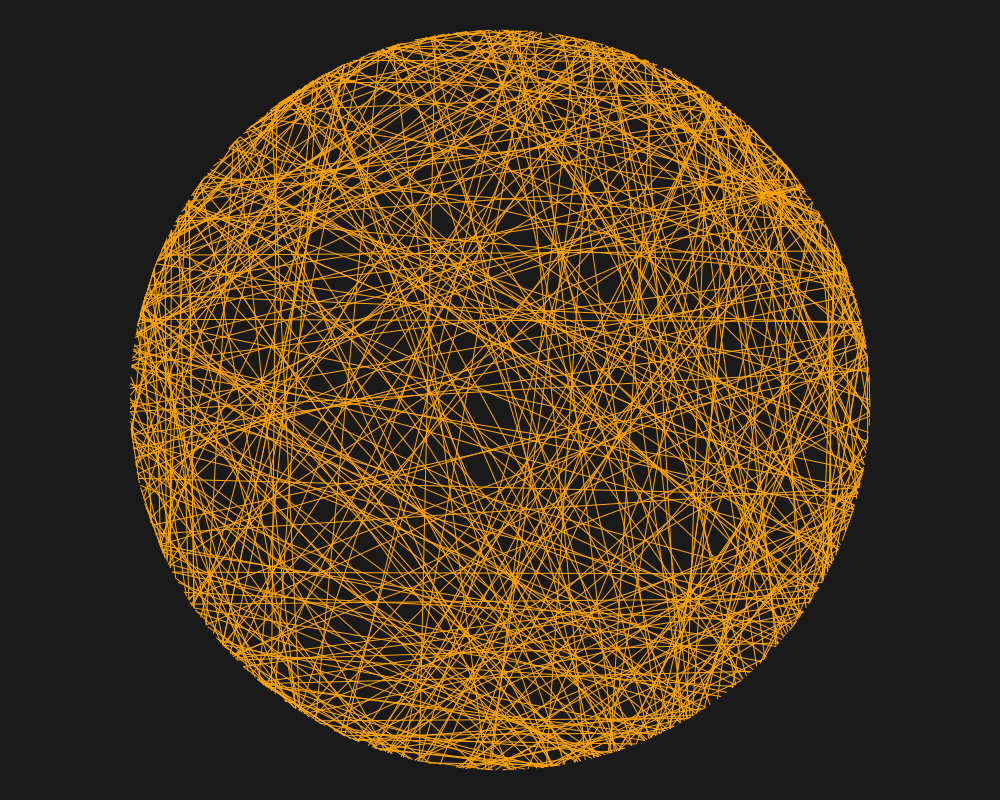

In [53]:
#Initial parameters
N = 1000
lambda = 1
Net = RandomNetwork.GenerateNetwork(lambda, N, 2)
g = Graph(N, Net)

@drawsvg begin
    background("grey10")
    sethue("orange")
    drawgraph(g, layout=shell, vertexshapesizes = 0.1, vertexstrokeweights = 0.001, vertexstrokecolors = colorant"red")
    end 1000 800

In [54]:
Net

1000-element Vector{Vector{Int64}}:
 [402]
 []
 []
 []
 []
 []
 []
 [80]
 []
 []
 ⋮
 []
 [719, 990]
 [622, 66]
 [186]
 [213, 672]
 []
 [416, 12]
 [319]
 []

In [55]:
global sum = 0
for i in 1:N
    global sum += length(Net[i])
end
ActualLambda = sum / N
println("Actual value for lambda = $ActualLambda")

Actual value for lambda = 1.0


### Degree Distribution

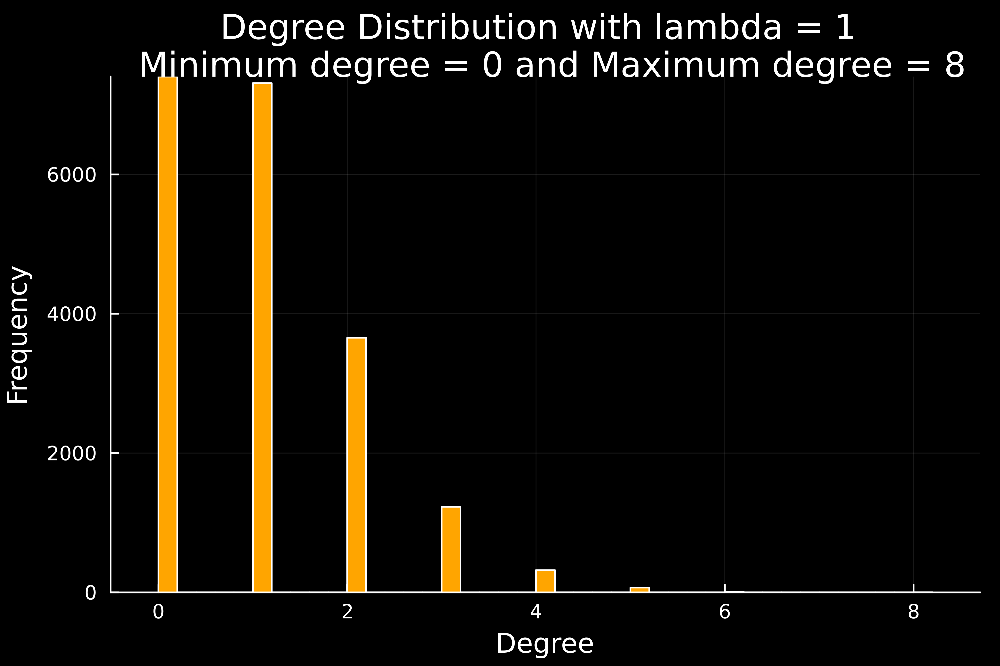

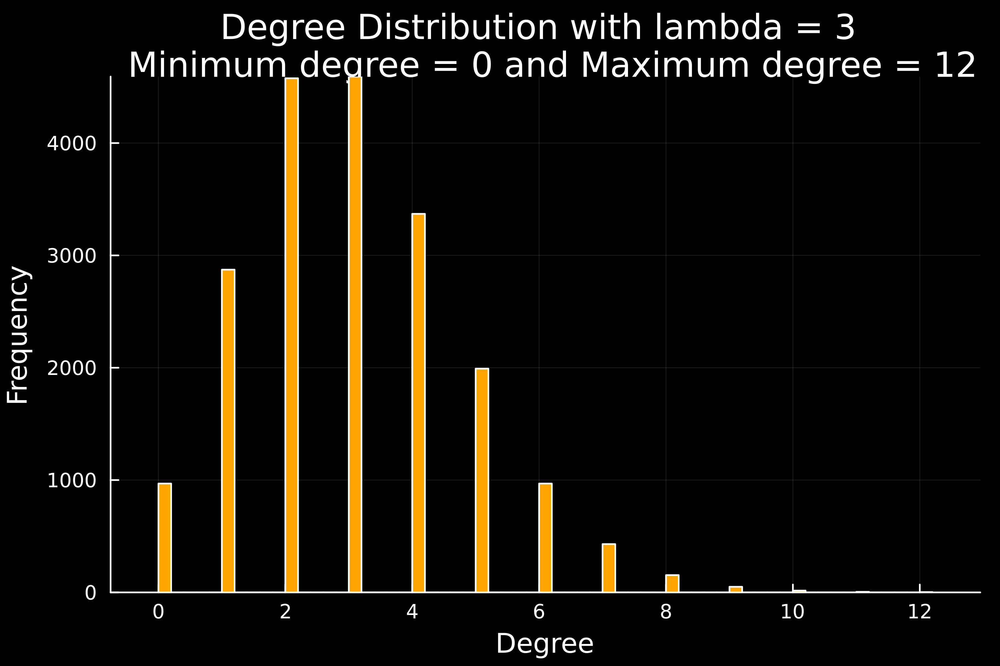

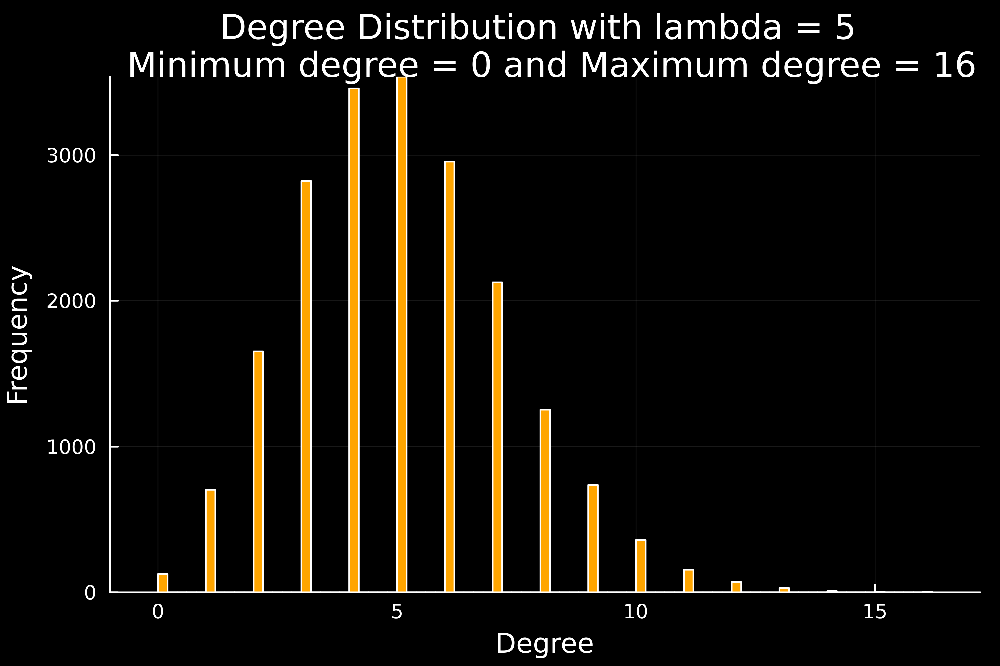

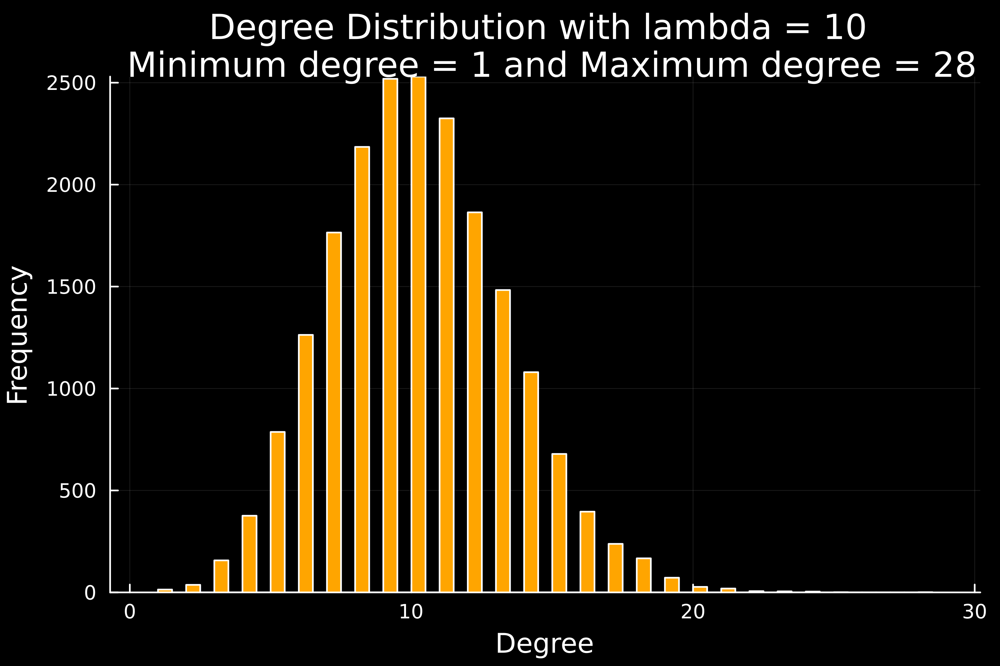

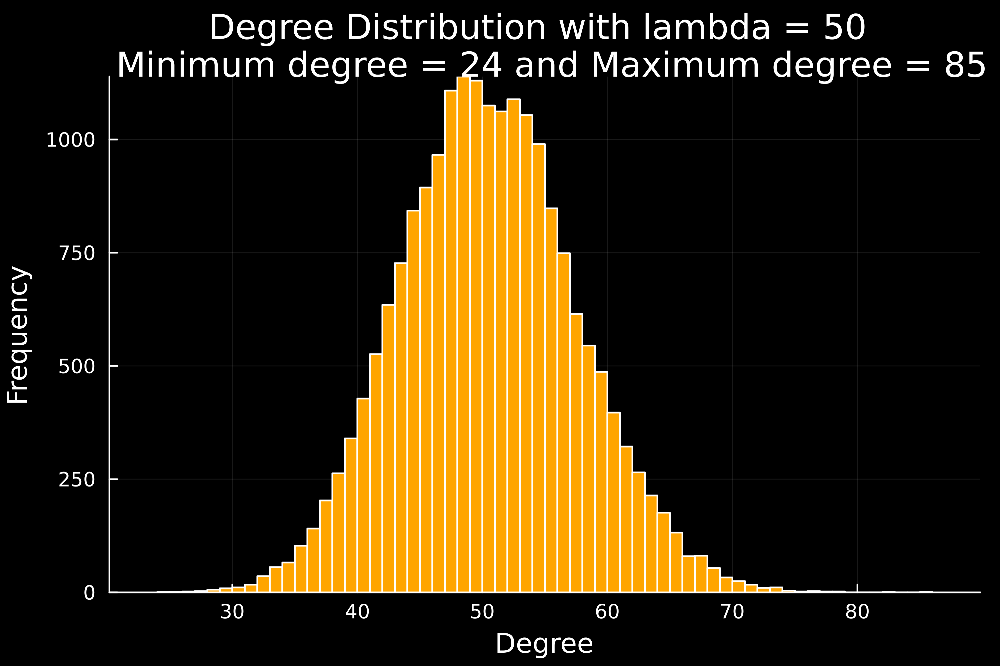

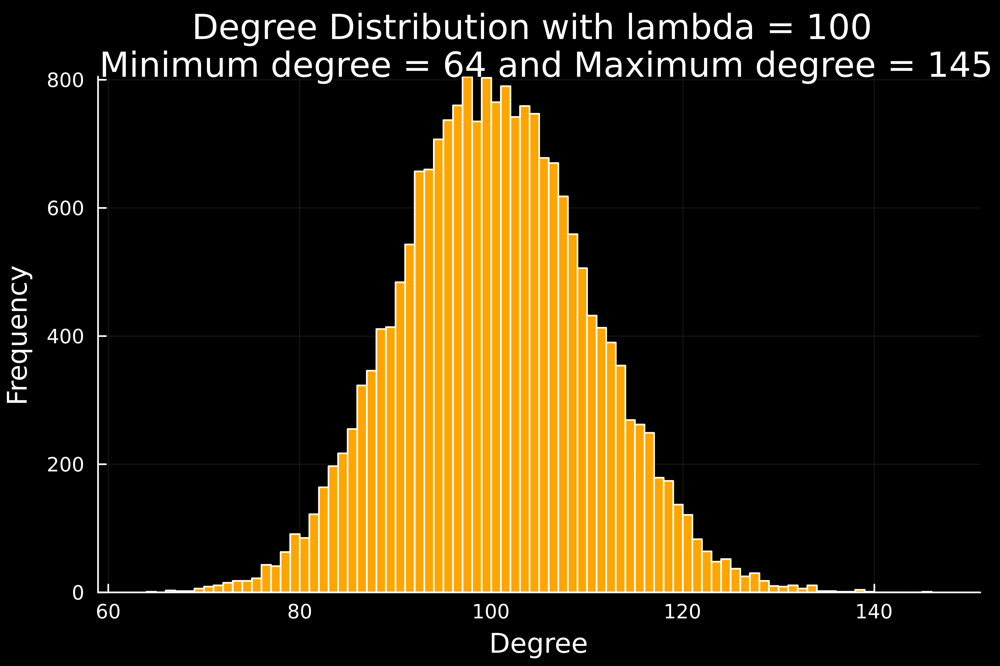

In [56]:
#Network Generation
N = 20000
lambdaArr = [1, 3, 5, 10, 50, 100] #Array of all lambdas we want to test
for lambda in lambdaArr
    DegreesArr = Int64[]
    Net = RandomNetwork.GenerateNetwork(lambda, N, 2)
    for j in 1:N
        push!(DegreesArr, length(Net[j]))
    end
    MinimumDegree = minimum(DegreesArr)
    maximumDegree = maximum(DegreesArr)
    display(histogram(DegreesArr, dpi = 500, title = "Degree Distribution with lambda = $lambda \n Minimum degree = $MinimumDegree and Maximum degree = $maximumDegree"
    , background = :black, legend = false,
     xlabel = "Degree", ylabel = "Frequency", color = :orange))
end


### Neighbour Degree Distribution

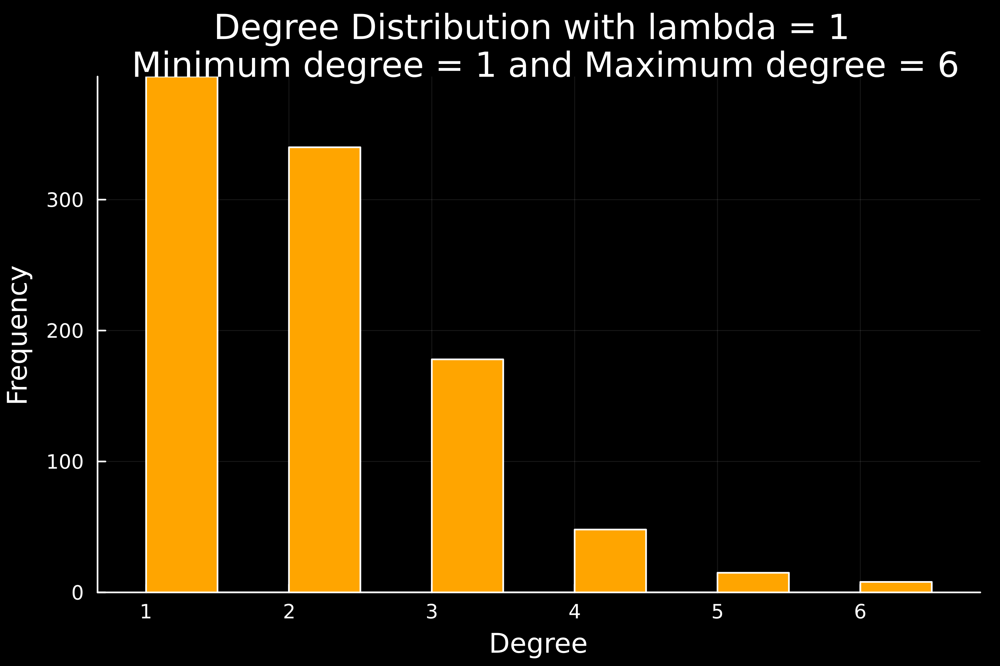

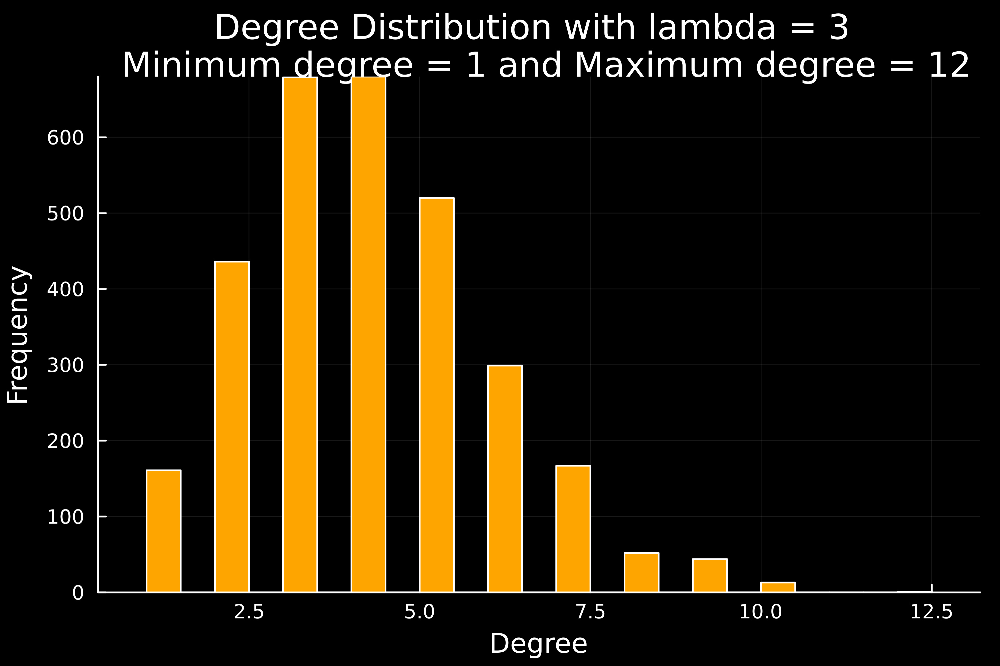

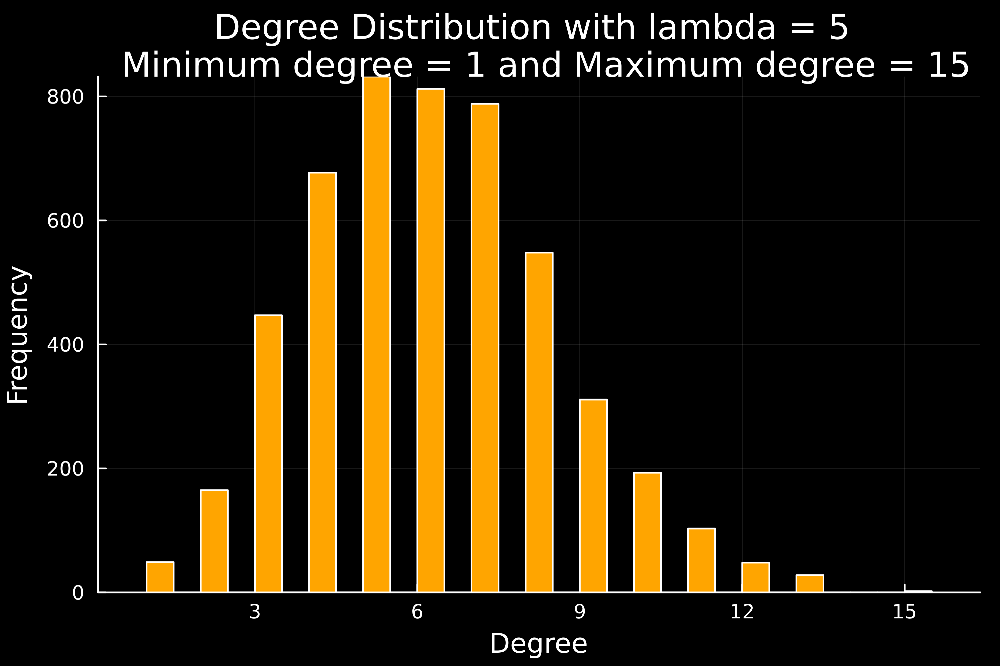

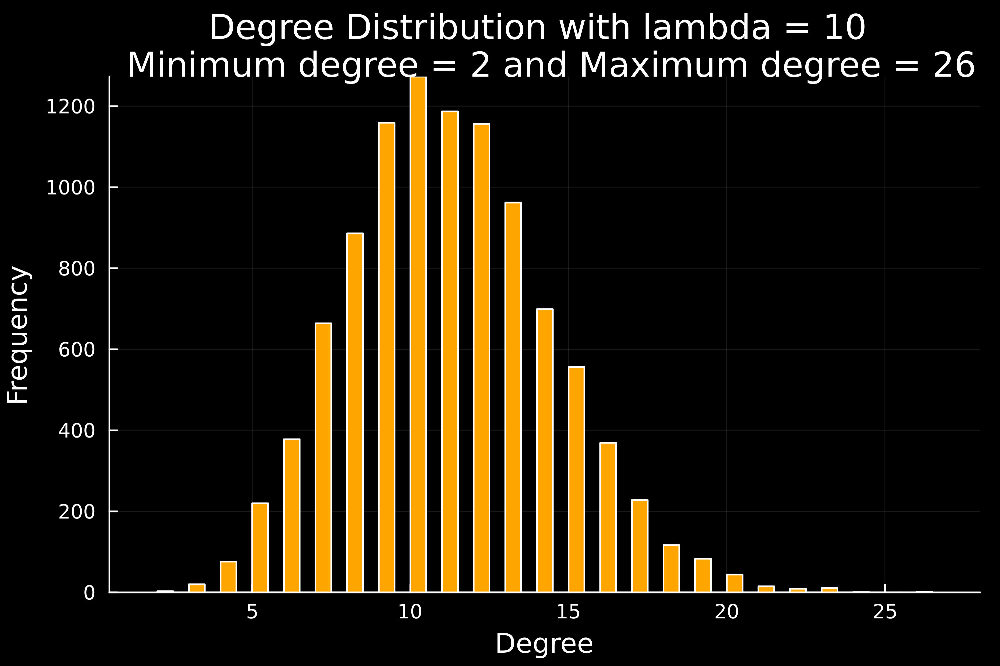

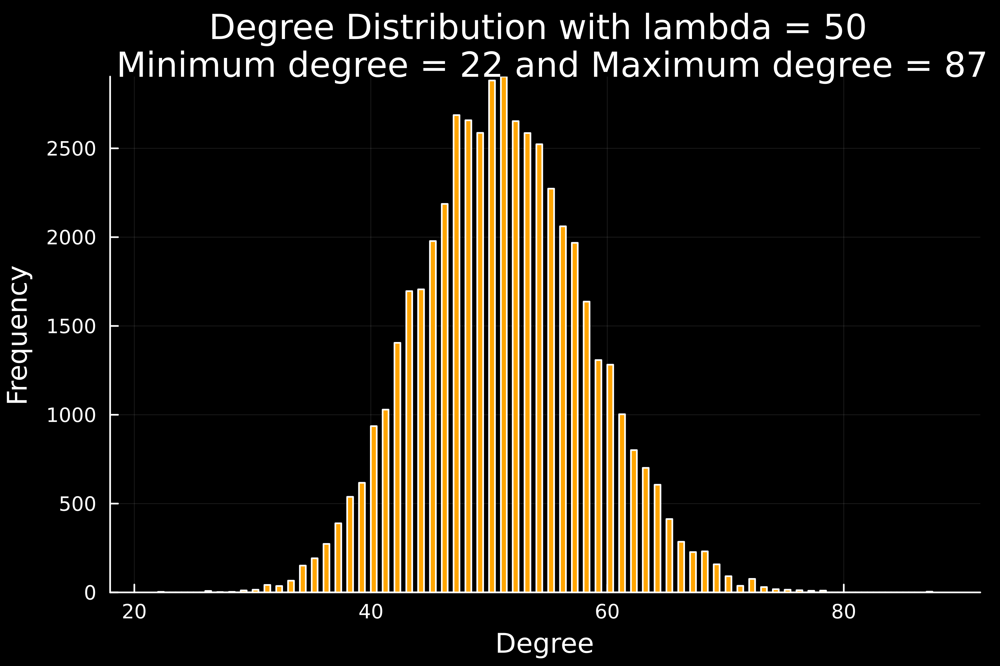

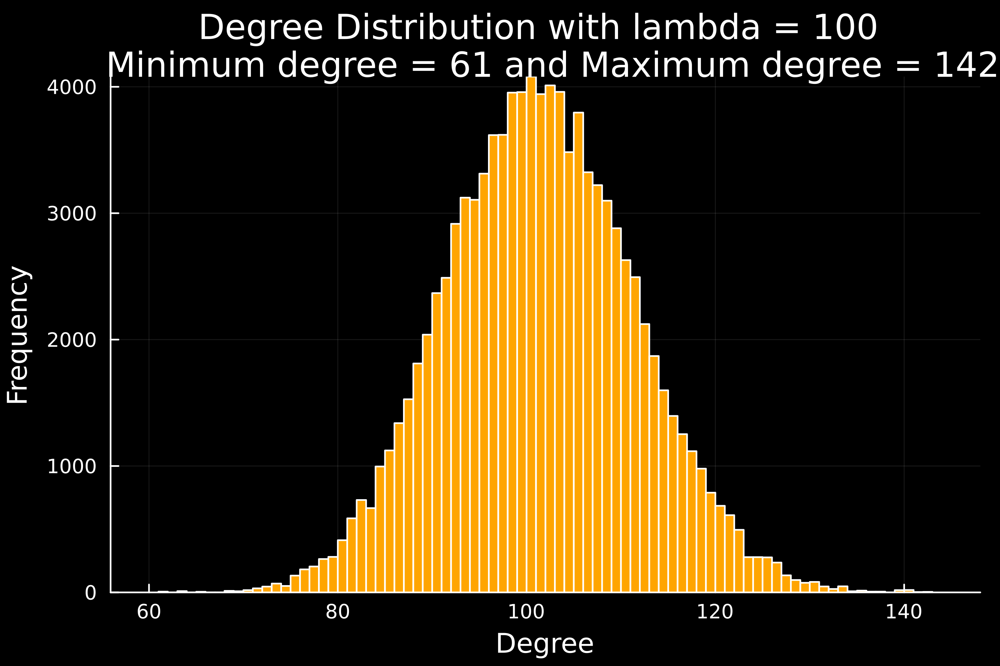

In [57]:
N = 20000
lambdaArr = [1, 3, 5, 10, 50, 100] #Array of all lambdas we want to test
SampleCount = 1000 #Number of randomly chosen nodes
for lambda in lambdaArr
    DegreesArr = Int64[]
    Net = RandomNetwork.GenerateNetwork(lambda, N, 2)
    for j in 1:SampleCount
        SelectedNode = rand(1:N)
        NeighbourArr = Net[SelectedNode]
        NeighbourCount = length(NeighbourArr)
        if NeighbourCount != 0
            for j in NeighbourArr
                push!(DegreesArr, length(Net[j]))
            end
        end
    end
    MinimumDegree = minimum(DegreesArr)
    maximumDegree = maximum(DegreesArr)
    display(histogram(DegreesArr, dpi = 500, title = "Degree Distribution with lambda = $lambda \n Minimum degree = $MinimumDegree and Maximum degree = $maximumDegree"
    , background = :black, legend = false,
     xlabel = "Degree", ylabel = "Frequency", color = :orange))
end
